## 3. Modelling

### PART-2: C-GAN 

Conditional Generative Adversarial Networks (cGANs) are a type of AI model that can generate data based on specific conditions. They take additional information, like labels or descriptions, to control what kind of data they produce. By considering these conditions, cGANs enable more precise control over the generated output. They have been successful in tasks like image synthesis and translation, allowing for fine-grained control in generating data that matches specific requirements.

Here, the labels would be the type of breeds for dog images.

In [1]:
# Import the necessary libraries
import numpy as np
import pandas as pd
import os
import time
import gc
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import zipfile
from PIL import Image
from tqdm import tqdm

import tensorflow as tf
from sklearn import preprocessing
%matplotlib inline

import keras
from keras.layers import Dense, Dropout, Input
from keras.models import Model,Sequential
from keras.layers import LeakyReLU
from keras.optimizers import Adam

2023-05-24 23:31:49.659959: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-24 23:31:52.653876: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2023-05-24 23:31:52.653991: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/loca

#### A. DATA EXTRACTION 

In [2]:
# Set the root directory path
ROOT = ''

# Get the list of images in the 'all-dogs' directory
IMAGES = os.listdir(ROOT + 'all-dogs/')

# Get the list of breeds in the 'Annotation' directory
breeds = os.listdir(ROOT + 'Annotation/')

# Initialize variables
idxIn = 0
namesIn = []
imagesIn = np.zeros((25000, 80, 80, 3))

# Iterate over breeds using tqdm for progress tracking
pbar_breeds = tqdm(breeds, desc='Processing Breeds', leave=False)
for breed in pbar_breeds:
    # Iterate over dogs in each breed
    for dog in os.listdir(ROOT + 'Annotation/' + breed):
        try:
            # Open the image file
            img = Image.open(ROOT + 'all-dogs/' + dog + '.jpg')
        except:
            continue
        
        # Get the width and height of the image
        ww, hh = img.size
        
        # Parse the XML annotation file
        tree = ET.parse(ROOT + 'Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        
        # Find all objects in the annotation file
        objects = root.findall('object')
        
        # Process each object
        for o in objects:
            # Find the bounding box coordinates
            bndbox = o.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            
            # Calculate the width of the bounding box
            w = np.min((xmax - xmin, ymax - ymin))
            
            # Add padding to the crops
            EXTRA = w // 8
            a1 = EXTRA
            a2 = EXTRA
            b1 = EXTRA
            b2 = EXTRA
            a1 = np.min((a1, xmin))
            a2 = np.min((a2, ww - xmin - w))
            b1 = np.min((b1, ymin))
            b2 = np.min((b2, hh - ymin - w))
            
            # Crop and resize the image
            img2 = img.crop((xmin - a1, ymin - b1, xmin + w + a2, ymin + w + b2))
            img2 = img2.resize((80, 80), Image.ANTIALIAS)
            # print(np.asarray(img2).shape)
            # Store the image and breed name in the respective arrays
            imagesIn[idxIn, :, :, :] = np.asarray(img2)
            namesIn.append(breed)
            idxIn += 1

# Shuffle the data
idx = np.arange(idxIn)
np.random.shuffle(idx)
imagesIn = imagesIn[idx, :, :, :]
namesIn = np.array(namesIn)[idx]


Processing Breeds:   0%|          | 0/120 [00:00<?, ?it/s]/var/tmp/ipykernel_112840/4122917166.py:61: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img2 = img2.resize((80, 80), Image.ANTIALIAS)


#### B. DATA TRANSFORMATION

In [3]:
def flip(x: tf.Tensor, y: tf.Tensor) -> (tf.Tensor, tf.Tensor):
    # Randomly flips the image horizontally
    x = tf.image.random_flip_left_right(x)  
    return (x, y)

def crop(x: tf.Tensor, y: tf.Tensor) -> (tf.Tensor, tf.Tensor):
    # Randomly crops the image to size 64x64x3
    x = tf.image.random_crop(x, size=[64, 64, 3])  
    return (x, y)


In [4]:
BATCH_SIZE = 32

# Preprocess the namesIn list
for i in range(len(namesIn)):
    # Split the name using '-' and extract the second part
    namesIn[i] = namesIn[i].split('-')[1].lower()

# Create a label encoder
le = preprocessing.LabelEncoder()

# Fit the label encoder and transform the namesIn list
namesIn = le.fit_transform(namesIn)

# Normalize the imagesIn array
imagesIn = (imagesIn[:idxIn,:,:,:] - 127.5) / 127.5

# Reduce the size of namesIn array to match the number of images
namesIn = namesIn[:idxIn]

# Convert imagesIn to float32 data type
imagesIn = imagesIn.astype('float32')

# Convert namesIn to int8 data type
namesIn = namesIn.astype('int8')

# Create a TensorFlow dataset from the imagesIn and namesIn arrays
dataset = tf.data.Dataset.from_tensor_slices((imagesIn, namesIn))

# Apply transformations to the dataset
dataset = dataset.map(flip).map(crop)

# Create batches of data with a specified batch size
dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)

print('TF Version', tf.__version__)
print()
print('-----Built TF data pipeline-----')

# Get the shape of the dataset
print(dataset)


2023-05-24 23:33:04.799705: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-24 23:33:04.813608: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-24 23:33:04.816996: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-24 23:33:04.880446: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

TF Version 2.11.0

-----Built TF data pipeline-----
<BatchDataset element_spec=(TensorSpec(shape=(32, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(32,), dtype=tf.int8, name=None))>


In [5]:
# Save the updated imagesIn array
np.save('imagesIn.npy', imagesIn)

### C. MODELLING PIPELINE

In [6]:
MAPS = 128
noise_dim = 128

from tensorflow.keras import layers
from tensorflow.keras.initializers import RandomNormal
init = RandomNormal(mean=0.0, stddev=0.02)

def create_generator():
    seed = tf.keras.Input(shape=((noise_dim,)))  # Input for the noise vector
    label = tf.keras.Input(shape=((1,)))  # Input for the label

    # Embedding layer to encode the label information
    x = layers.Embedding(120, 120, input_length=1, name='emb')(label)
    x = layers.Flatten()(x)

    # Concatenate the noise vector and the label embedding
    generator = layers.concatenate([seed, x])

    # Dense layer to increase the dimensions
    generator = layers.Dense(4*4*MAPS*8, use_bias=False)(generator)
    generator = layers.Reshape((4, 4, MAPS*8))(generator)
    generator = layers.BatchNormalization()(generator)
    generator = layers.ReLU()(generator)

    # Transposed convolutional layers for upsampling
    generator = layers.Conv2DTranspose(MAPS*4, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(generator)
    generator = layers.BatchNormalization()(generator)
    generator = layers.ReLU()(generator)

    generator = layers.Conv2DTranspose(MAPS*2, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(generator)
    generator = layers.BatchNormalization()(generator)
    generator = layers.ReLU()(generator)

    generator = layers.Conv2DTranspose(MAPS, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(generator)
    generator = layers.BatchNormalization()(generator)
    generator = layers.ReLU()(generator)

    # Final transposed convolutional layer to generate the output image
    generator = layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False, activation='tanh')(generator)

    model = tf.keras.Model(inputs=[seed, label], outputs=generator)
    return model

# Build the model
generator = create_generator()

# Print the summary of model
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 emb (Embedding)                (None, 1, 120)       14400       ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 flatten (Flatten)              (None, 120)          0           ['emb[0][0]']                    
                                                                                              

/opt/conda/lib/python3.10/site-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [7]:
def create_discriminator():
    image = tf.keras.Input(shape=((64,64,3)))  # Input for the image
    label = tf.keras.Input(shape=((1,)))  # Input for the label

    # Embedding layer to encode the label information
    discriminator = layers.Embedding(120, 64*64, input_length=1)(label)
    discriminator = layers.Reshape((64,64,1))(discriminator)
    
    # Concatenate the image and label embedding
    discriminator = layers.concatenate([image, discriminator])

    # Convolutional layers for downsampling and feature extraction
    discriminator = layers.Conv2D(MAPS, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(discriminator)
    discriminator = layers.BatchNormalization()(discriminator)
    discriminator = layers.LeakyReLU()(discriminator)

    discriminator = layers.Conv2D(MAPS*2, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(discriminator)
    discriminator = layers.BatchNormalization()(discriminator)
    discriminator = layers.LeakyReLU()(discriminator)

    discriminator = layers.Conv2D(MAPS*4, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(discriminator)
    discriminator = layers.BatchNormalization()(discriminator)
    discriminator = layers.LeakyReLU()(discriminator)

    discriminator = layers.Conv2D(MAPS*8, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(discriminator)
    discriminator = layers.BatchNormalization()(discriminator)
    discriminator = layers.LeakyReLU()(discriminator)

    discriminator = layers.Flatten()(discriminator)

    # Classification layer to predict the label
    discriminator = layers.Dense(121, activation='sigmoid')(discriminator)

    # Output layer to predict the validity of the image
    discriminator2 = layers.Dense(1, activation='linear')(discriminator)

    model = tf.keras.Model(inputs=[image, label], outputs=[discriminator, discriminator2])
    return model

# Build the discriminator
discriminator = create_discriminator()

# Print the sumary of model
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 4096)      491520      ['input_4[0][0]']                
                                                                                                  
 input_3 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 reshape_1 (Reshape)            (None, 64, 64, 1)    0           ['embedding[0][0]']              
                                                                                            

In [8]:
# The Adam optimizer is used for updating the generator model's weights.
# It uses the specified learning rate and the momentum parameter (beta_1=0.5) for optimization.
learning_rate = 0.0002  # Learning rate for the optimizer

# Generator optimizer
generator_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=0.5)

# Discriminator optimizer
discriminator_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=0.5)

In [9]:
DISPLAY_EVERY = 5  # Number of iterations to display generated images
kernel_start = time.time()  # Record the starting time of the kernel
LIMIT = 8  # Limit on the number of iterations

# Function to display generated images
def display_images(model, test_input, labs):
    predictions = model([test_input, labs], training=False)  # Generate images using the model
    fig = plt.figure(figsize=(16, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(2, 4, i+1)
        plt.imshow((predictions[i, :, :, :] + 1.) / 2.)  # Display the generated image
        plt.axis('off')
    plt.show()

# Function to generate latent points for input to the generator
def generate_latent_points(latent_dim, n_samples):
    return tf.random.truncated_normal((n_samples, latent_dim))


In [10]:
def cgan(dataset, epochs):
    all_gl = np.array([])  # Array to store generator losses for all epochs
    all_dl = np.array([])  # Array to store discriminator losses for all epochs

    for epoch in range(epochs):
        start = time.time()
        gl = []  # List to store generator losses for the current epoch
        dl = []  # List to store discriminator losses for the current epoch

        # TENSORFLOW DATA.DATASET SHUFFLING WORKAROUND
        idx = np.arange(idxIn)
        np.random.shuffle(idx)
        dataset = (tf.data.Dataset.from_tensor_slices((imagesIn[idx, :, :, :], namesIn[idx]))
                   .map(flip).map(crop).batch(BATCH_SIZE, drop_remainder=True))

        # TRAIN ACGAN
        for i, image_batch in enumerate(dataset):
            gg, dd = train_step(image_batch, generator, discriminator,
                               generator_optimizer, discriminator_optimizer)
            gl.append(gg)
            dl.append(dd)

        all_gl = np.append(all_gl, np.array([gl]))  # Append generator losses to all_gl array
        all_dl = np.append(all_dl, np.array([dl]))  # Append discriminator losses to all_dl array

        # EXPONENTIALLY DECAY LEARNING RATES
        if epoch > 180:
            learning_rate.assign(learning_rate * 0.95)

        # DISPLAY PROGRESS
        if epoch % DISPLAY_EVERY == 0:
            # DISPLAY IMAGES FROM TRAIN PROGRESS
            seed = generate_latent_points(noise_dim, num_examples)
            labs = tf.cast(120 * tf.random.uniform((num_examples, 1)), tf.int8)
            display_images(generator, seed, labs)

            # PRINT STATS
            print('EPOCH', epoch, 'took', np.round(time.time() - start, 1), 'sec')
            print('Gen_loss mean=', np.mean(gl), 'std=', np.std(gl))
            print('Disc_loss mean=', np.mean(dl), 'std=', np.std(dl))
            print('Learning rate = ', end='')
            tf.print(discriminator_optimizer._learning_rate)

        x = gc.collect()
        tt = np.round((time.time() - kernel_start) / 60, 1)
        if tt > LIMIT * 60:
            break

    # PLOT ALL TIME LOSS
    plt.figure(figsize=(16, 2))
    plt.plot(np.arange(len(all_gl)), all_gl, label='Gen_loss')
    plt.plot(np.arange(len(all_dl)), all_dl, label='Disc_loss')
    plt.legend()
    plt.ylim((0, np.min([1.1 * np.max(all_gl), 2 * ymax])))
    plt.title('All Time Loss')
    plt.show()


In [11]:
EPOCHS = 250  # Number of epochs
num_examples = 8  # Number of examples to display during training

@tf.function
def train_step(images, generator, discriminator, generator_optimizer, discriminator_optimizer):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.4)  # Binary cross-entropy loss
    bce2 = tf.keras.losses.BinaryCrossentropy(from_logits=False, label_smoothing=0.4)  # Categorical cross-entropy loss

    noise = tf.random.normal((32, 128))  # Noise vector for generator input
    labs = tf.cast(120 * tf.random.uniform((32,)), tf.int32)  # Random labels for generator input

    # Use GradientTape to calculate gradients
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator([noise, labs], training=True)  # Generate images using generator

        real_cat, real_output = discriminator([images[0], images[1]], training=True)  # Real image predictions
        fake_cat, fake_output = discriminator([generated_images, labs], training=True)  # Fake image predictions

        # GENERATOR LOSS
        gen_loss = (tf.reduce_mean((real_output - tf.reduce_mean(fake_output, 0) + tf.ones_like(real_output)) ** 2, 0)
                    + tf.reduce_mean((fake_output - tf.reduce_mean(real_output, 0) - tf.ones_like(real_output)) ** 2, 0)) / 2.

        # DISCRIMINATOR LOSS
        disc_loss = bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

        real_cat2 = tf.one_hot(tf.cast(images[1], tf.int32), 121, dtype=tf.int32)  # Real label one-hot encoding
        fake_cat2 = tf.one_hot(120 * tf.ones((32,), tf.int32), 121, dtype=tf.int32)  # Fake label one-hot encoding
        disc_loss += bce2(real_cat2, real_cat) + bce2(fake_cat2, fake_cat)

    # BACK PROPAGATE ERROR
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


-----Training Starts-----
-----Displaying every 5th epoch-----


2023-05-24 23:33:18.254007: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8200
2023-05-24 23:33:19.783066: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f02a0b9e710 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-05-24 23:33:19.783124: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2023-05-24 23:33:19.789488: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-05-24 23:33:19.933142: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


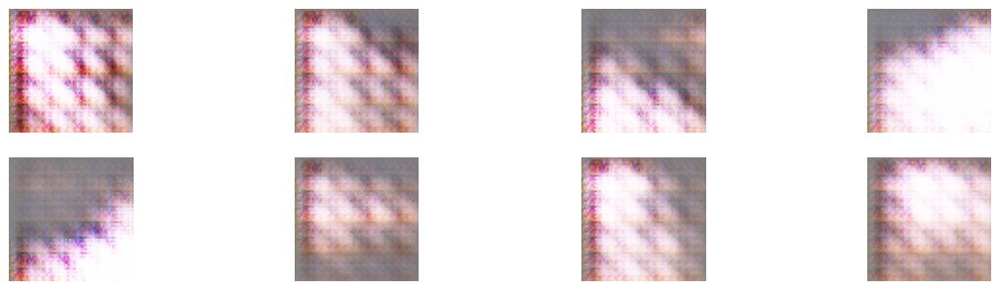

EPOCH 0 took 222.9 sec
Gen_loss mean= 6.6757054 std= 3.3870273
Disc_loss mean= 2.344063 std= 0.31105858
Learning rate = 0.0002


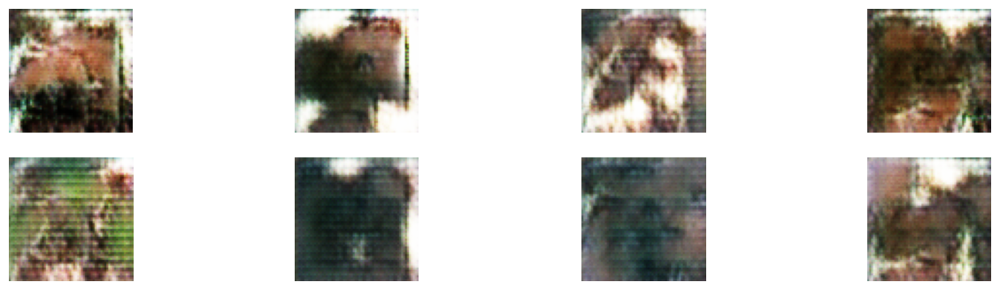

EPOCH 5 took 211.6 sec
Gen_loss mean= 5.131925 std= 1.4674233
Disc_loss mean= 2.2662852 std= 0.103130214
Learning rate = 0.0002


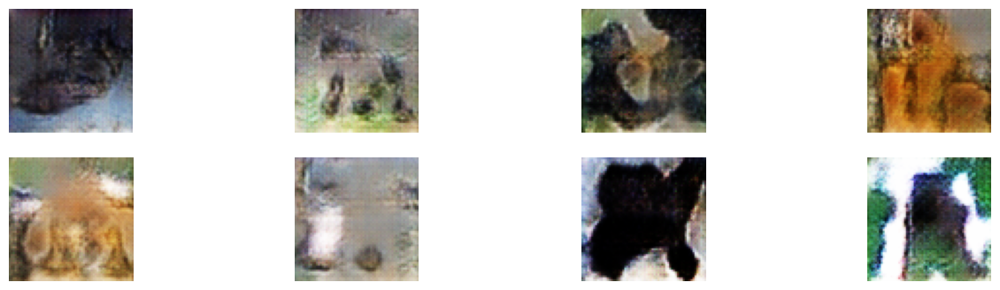

EPOCH 10 took 211.4 sec
Gen_loss mean= 4.4858165 std= 1.5808319
Disc_loss mean= 2.2734516 std= 0.10282023
Learning rate = 0.0002


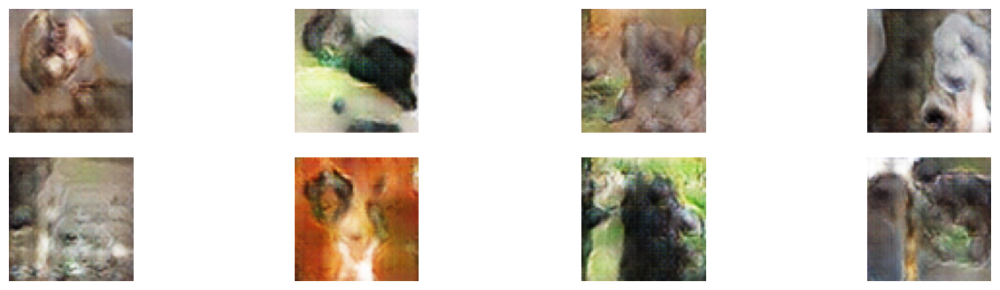

EPOCH 15 took 211.5 sec
Gen_loss mean= 3.827381 std= 1.5162214
Disc_loss mean= 2.2871916 std= 0.10424116
Learning rate = 0.0002


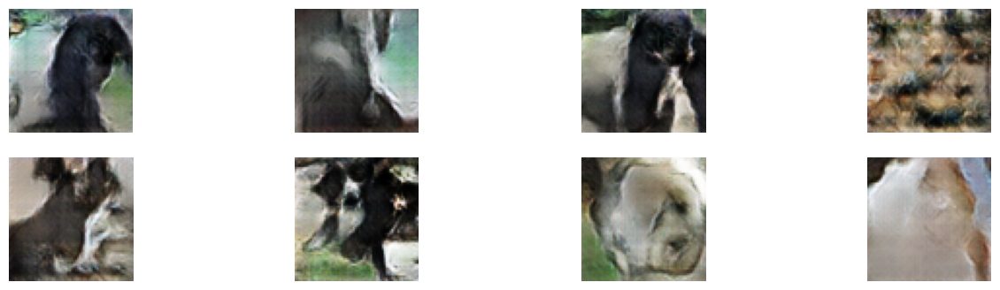

EPOCH 20 took 211.2 sec
Gen_loss mean= 4.9176292 std= 1.8689533
Disc_loss mean= 2.247256 std= 0.10566771
Learning rate = 0.0002


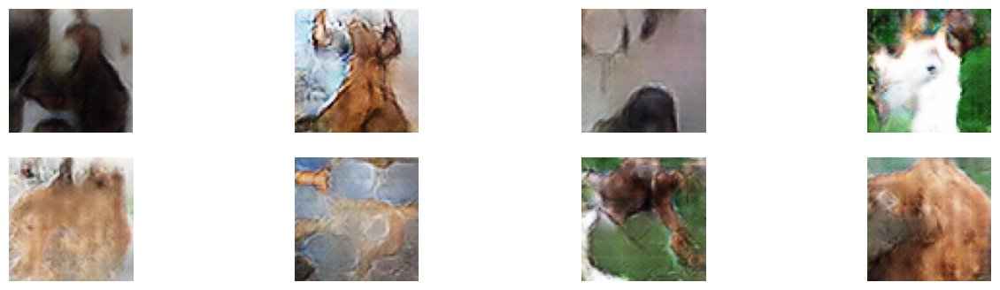

EPOCH 25 took 211.4 sec
Gen_loss mean= 4.689161 std= 2.0338778
Disc_loss mean= 2.2559237 std= 0.11688781
Learning rate = 0.0002


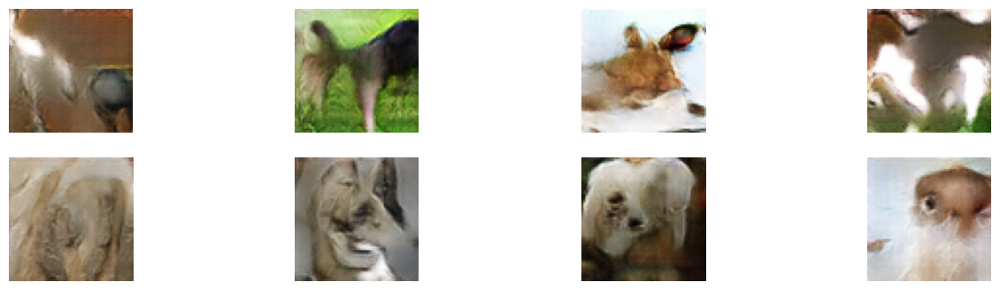

EPOCH 30 took 210.9 sec
Gen_loss mean= 5.3278093 std= 2.296731
Disc_loss mean= 2.2310843 std= 0.11275333
Learning rate = 0.0002


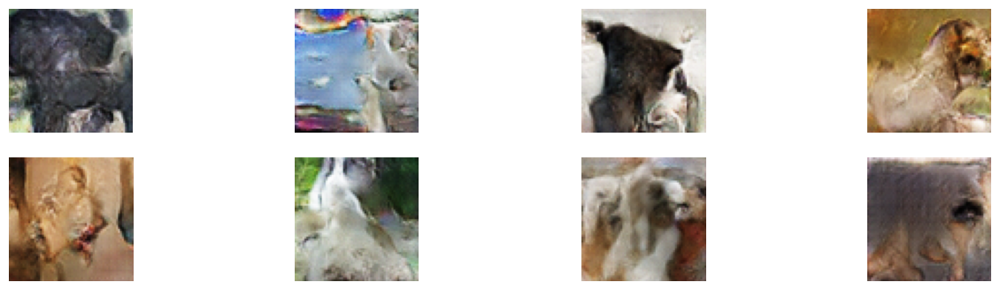

EPOCH 35 took 211.3 sec
Gen_loss mean= 5.65913 std= 2.3448315
Disc_loss mean= 2.220044 std= 0.118349396
Learning rate = 0.0002


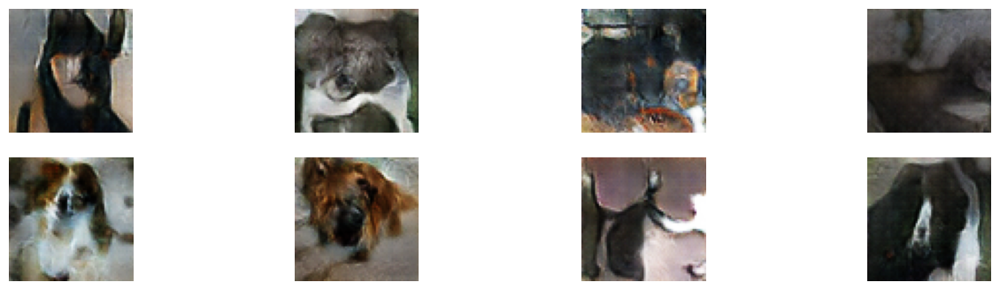

EPOCH 40 took 211.2 sec
Gen_loss mean= 6.1585803 std= 2.4826667
Disc_loss mean= 2.2064505 std= 0.1170972
Learning rate = 0.0002


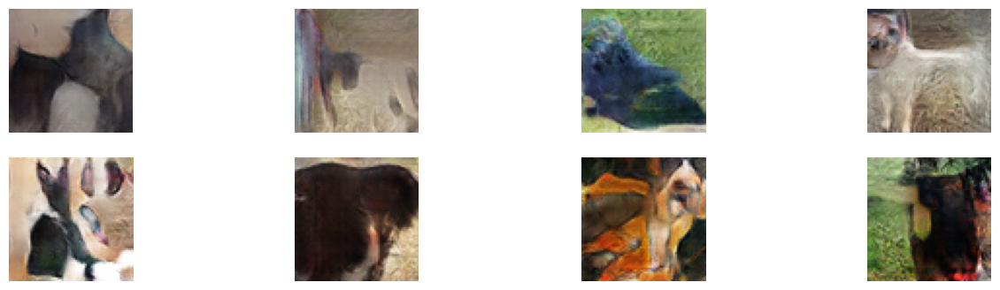

EPOCH 55 took 211.2 sec
Gen_loss mean= 7.858404 std= 2.7043562
Disc_loss mean= 2.155532 std= 0.10986866
Learning rate = 0.0002


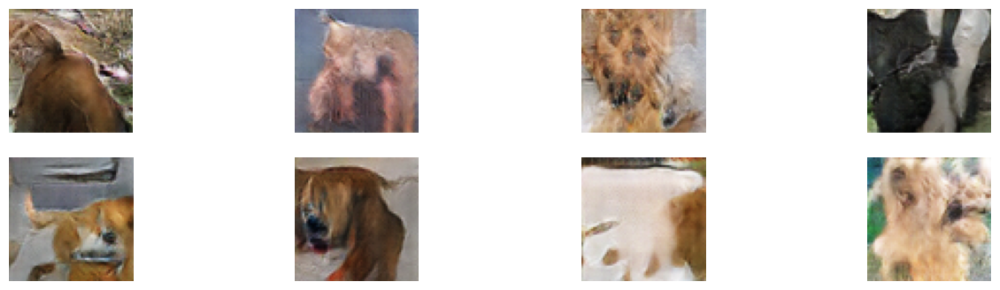

EPOCH 60 took 211.0 sec
Gen_loss mean= 8.3975 std= 2.7289257
Disc_loss mean= 2.1422014 std= 0.10435058
Learning rate = 0.0002


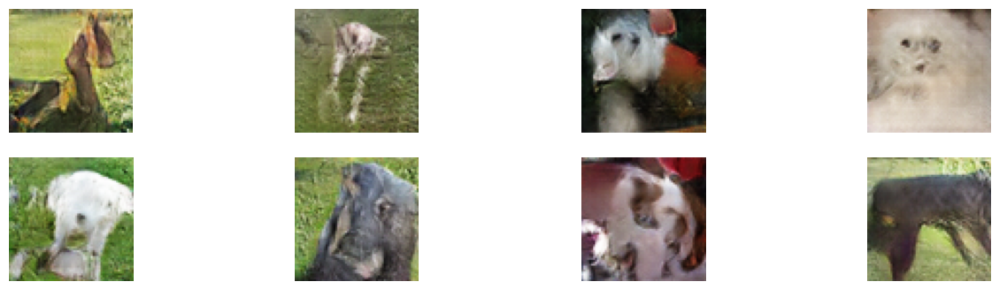

EPOCH 65 took 211.3 sec
Gen_loss mean= 8.400206 std= 2.5419834
Disc_loss mean= 2.139854 std= 0.10207369
Learning rate = 0.0002


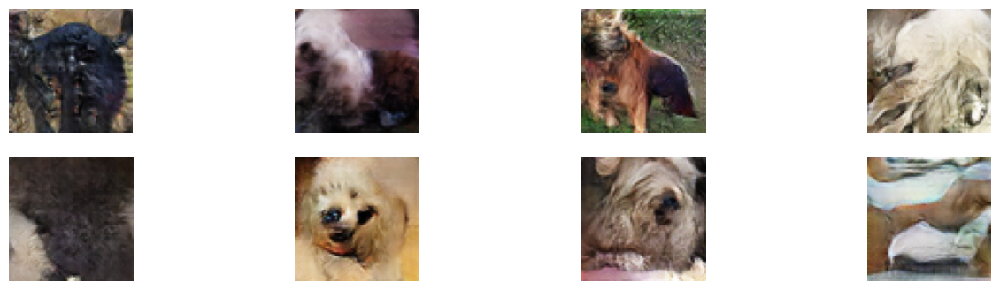

EPOCH 70 took 211.1 sec
Gen_loss mean= 8.523794 std= 2.6865766
Disc_loss mean= 2.1363602 std= 0.10886612
Learning rate = 0.0002


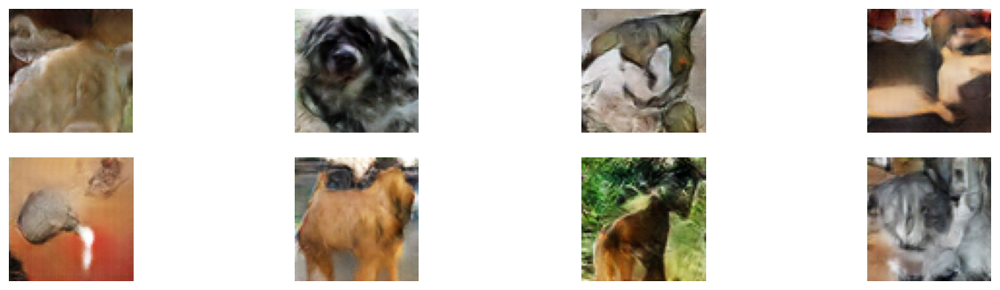

EPOCH 75 took 210.9 sec
Gen_loss mean= 9.140601 std= 2.8124976
Disc_loss mean= 2.12283 std= 0.10133826
Learning rate = 0.0002


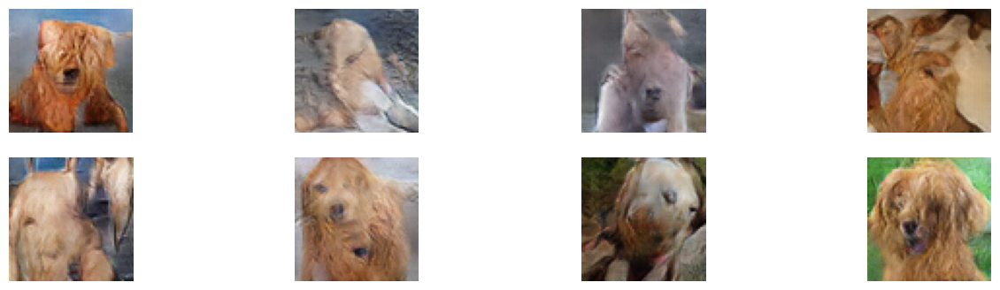

EPOCH 80 took 211.1 sec
Gen_loss mean= 9.228741 std= 2.9297073
Disc_loss mean= 2.122557 std= 0.115034334
Learning rate = 0.0002


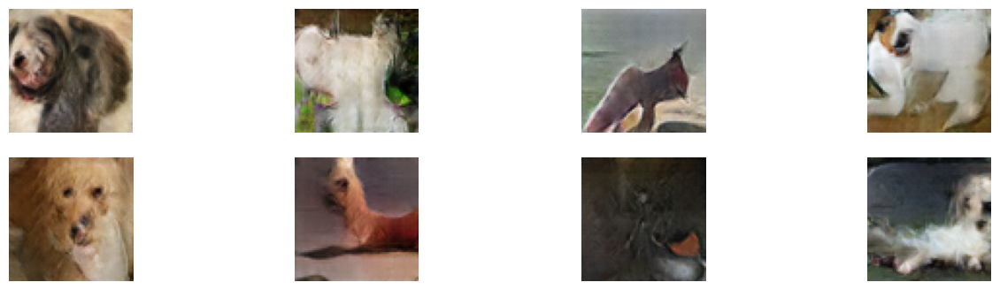

EPOCH 85 took 211.0 sec
Gen_loss mean= 10.04721 std= 2.7075956
Disc_loss mean= 2.0977113 std= 0.09171522
Learning rate = 0.0002


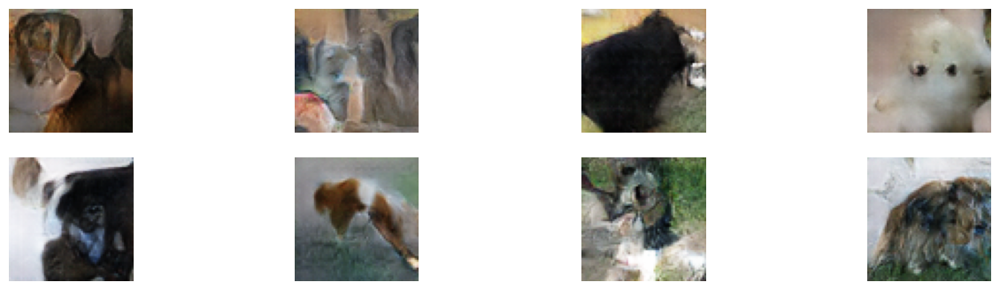

EPOCH 90 took 210.9 sec
Gen_loss mean= 10.3189745 std= 2.7469916
Disc_loss mean= 2.0901625 std= 0.09608419
Learning rate = 0.0002


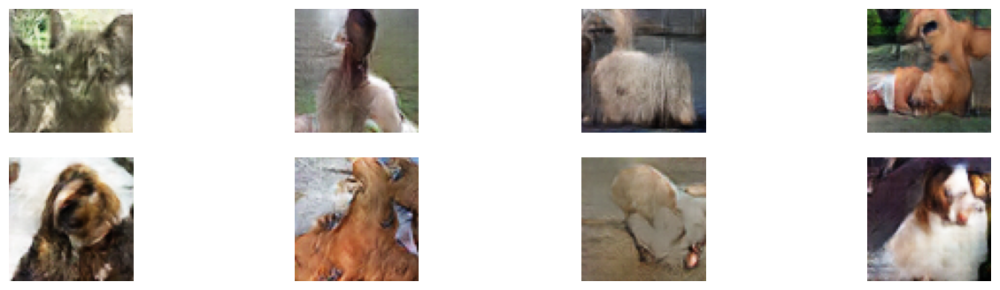

EPOCH 95 took 211.0 sec
Gen_loss mean= 10.345469 std= 2.7339294
Disc_loss mean= 2.0866413 std= 0.09004367
Learning rate = 0.0002


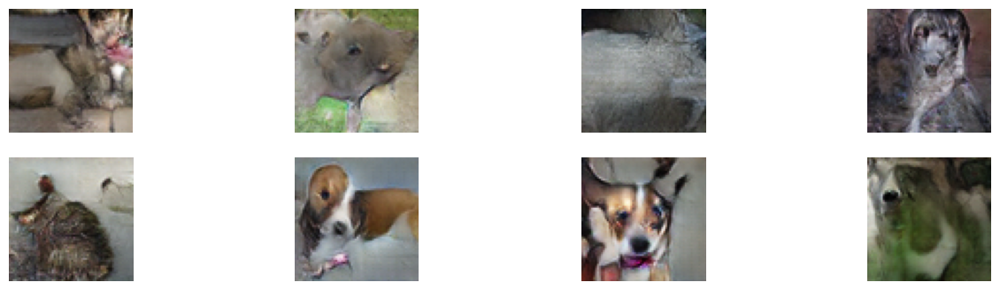

EPOCH 100 took 210.9 sec
Gen_loss mean= 10.844971 std= 2.753589
Disc_loss mean= 2.0798523 std= 0.0996422
Learning rate = 0.0002


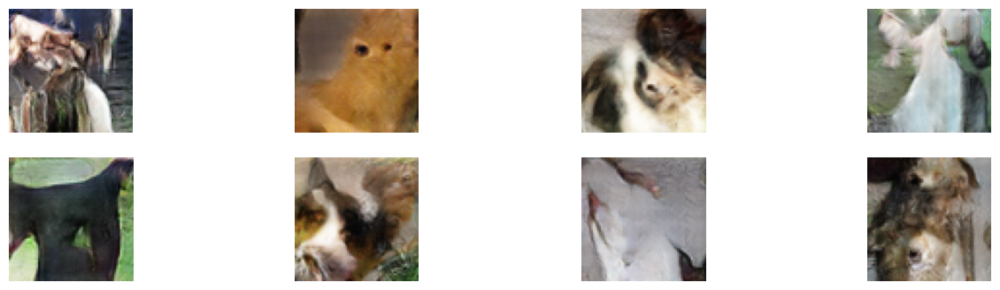

EPOCH 105 took 210.9 sec
Gen_loss mean= 10.430567 std= 2.840925
Disc_loss mean= 2.08805 std= 0.10316156
Learning rate = 0.0002


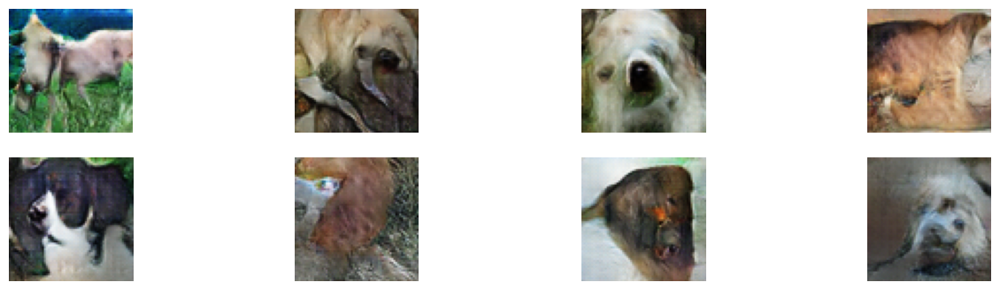

EPOCH 110 took 211.0 sec
Gen_loss mean= 11.025294 std= 2.7311118
Disc_loss mean= 2.0721629 std= 0.094833426
Learning rate = 0.0002


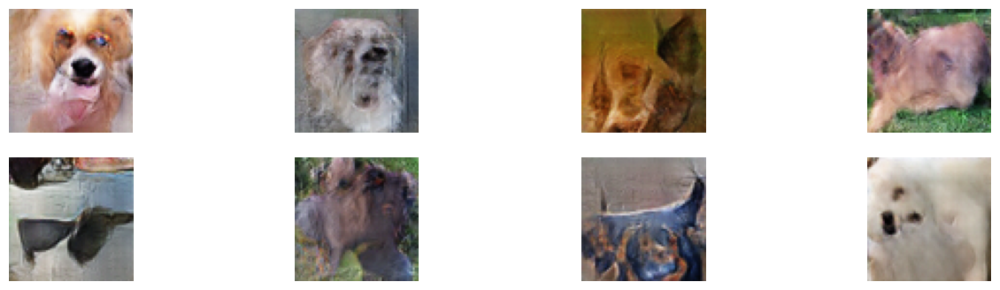

EPOCH 115 took 211.1 sec
Gen_loss mean= 10.634256 std= 2.8091516
Disc_loss mean= 2.083195 std= 0.101146795
Learning rate = 0.0002


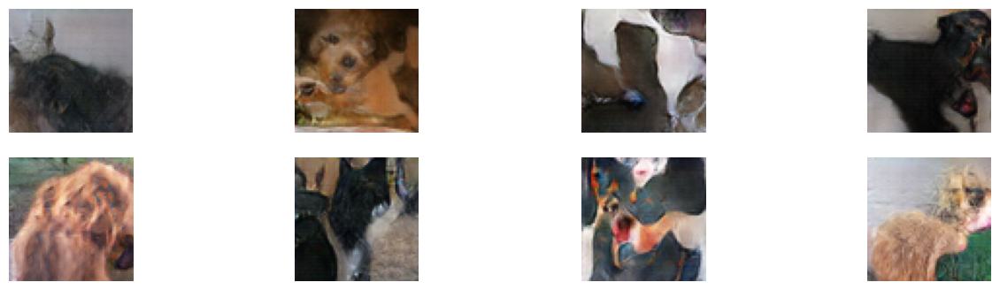

EPOCH 120 took 210.9 sec
Gen_loss mean= 11.181893 std= 2.7558057
Disc_loss mean= 2.0683982 std= 0.09845226
Learning rate = 0.0002


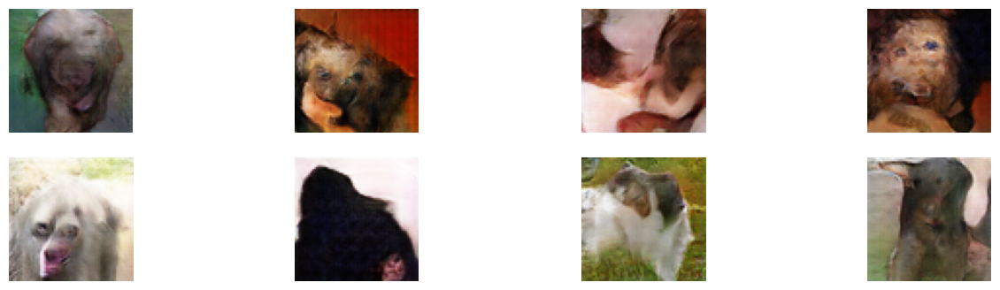

EPOCH 125 took 211.0 sec
Gen_loss mean= 10.948341 std= 2.9524448
Disc_loss mean= 2.0792696 std= 0.11266959
Learning rate = 0.0002


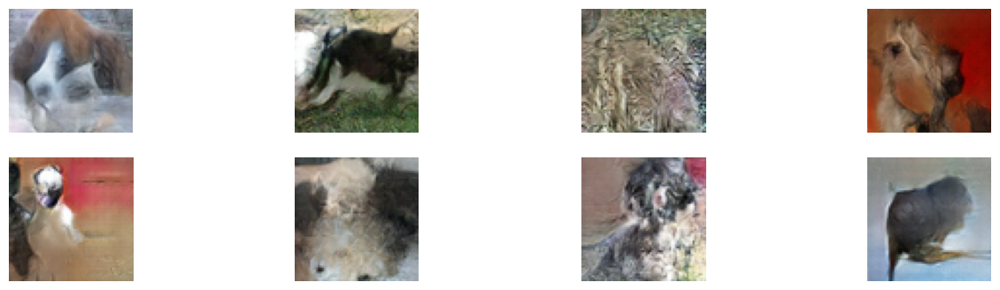

EPOCH 130 took 210.9 sec
Gen_loss mean= 11.3658085 std= 2.5912628
Disc_loss mean= 2.0622957 std= 0.089010656
Learning rate = 0.0002


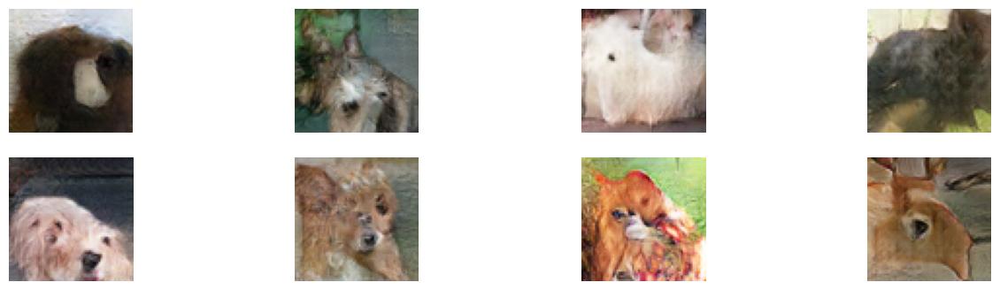

EPOCH 135 took 210.9 sec
Gen_loss mean= 11.422918 std= 2.768681
Disc_loss mean= 2.0679605 std= 0.10905745
Learning rate = 0.0002


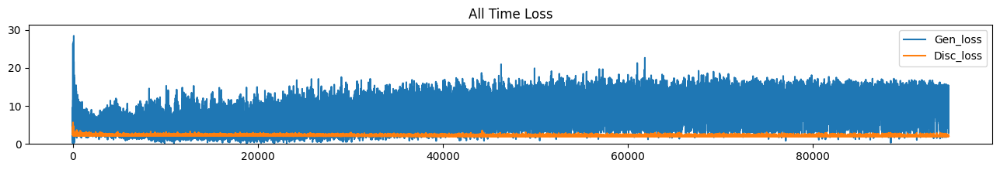

In [12]:
print('-----Training Starts-----')
print('-----Displaying every '+str(DISPLAY_EVERY)+'th epoch-----')
cgan(dataset, EPOCHS)

C-GAN is better at handling the losses over time. It can be noted from above that generater loss remained regulated throughout the model training.

Let's compare the real and fake images for final interpretion.

-----Sample Dog Images by Breed-----


Keeshond ----REAL vs FAKE IMAGES (variety = 1.0 )-----



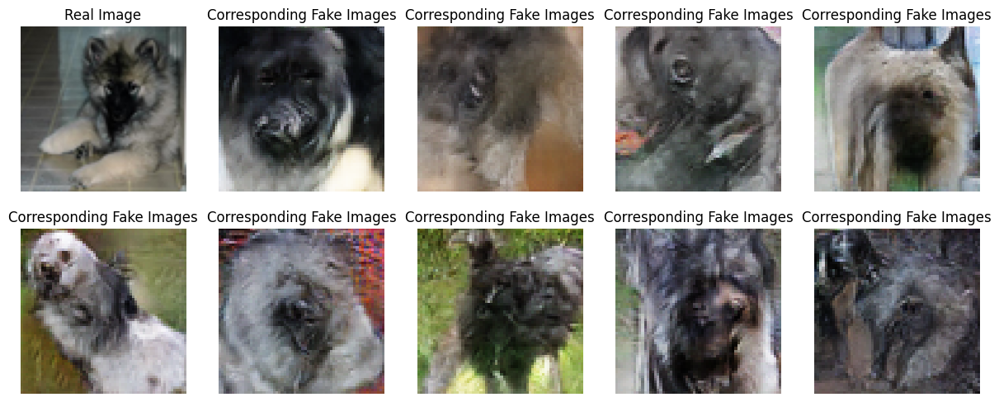


Miniature_pinscher ----REAL vs FAKE IMAGES (variety = 2.2 )-----



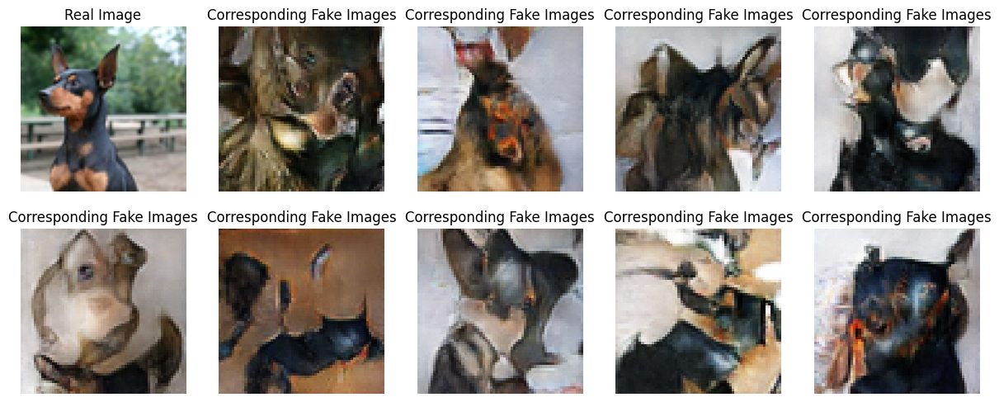


Sealyham_terrier ----REAL vs FAKE IMAGES (variety = 1.1 )-----



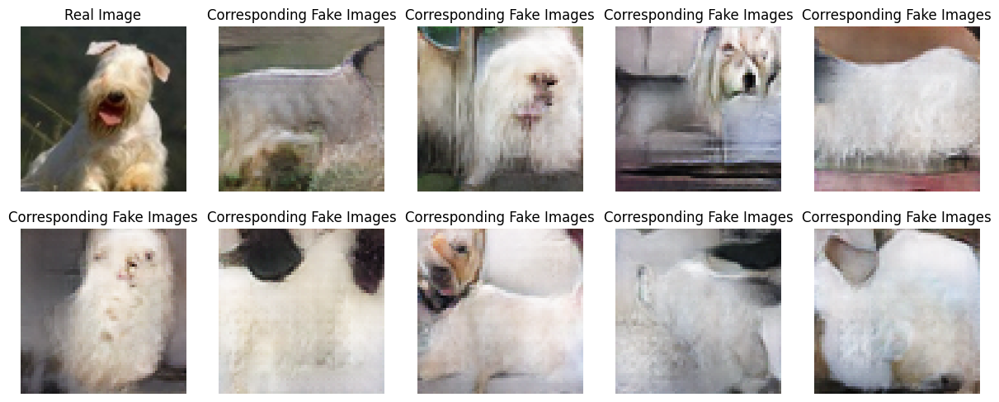


Maltese_dog ----REAL vs FAKE IMAGES (variety = 1.3 )-----



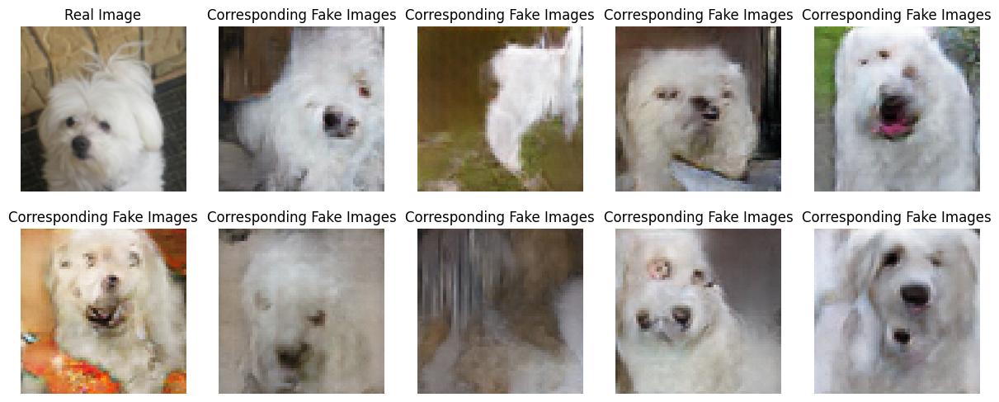


Boston_bull ----REAL vs FAKE IMAGES (variety = 2.6 )-----



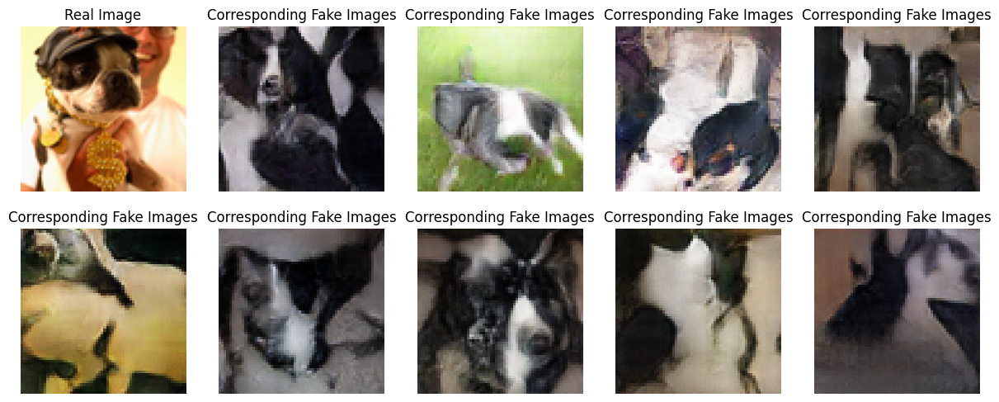


Yorkshire_terrier ----REAL vs FAKE IMAGES (variety = 1.2 )-----



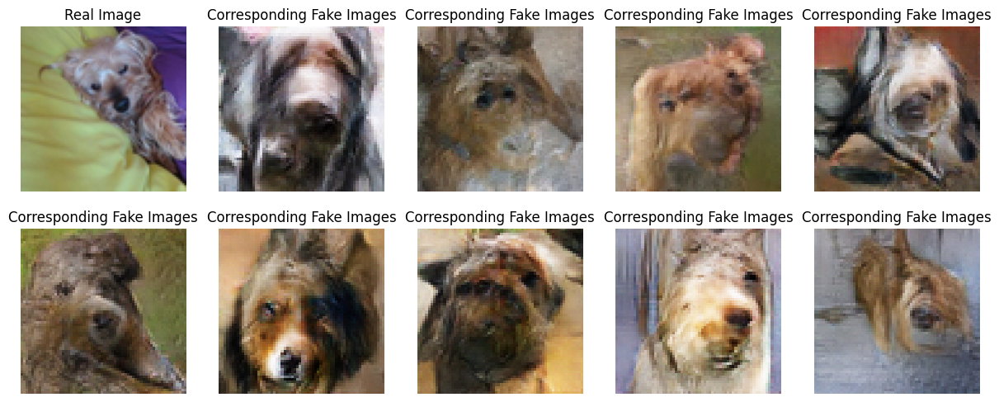


Yorkshire_terrier ----REAL vs FAKE IMAGES (variety = 2.3 )-----



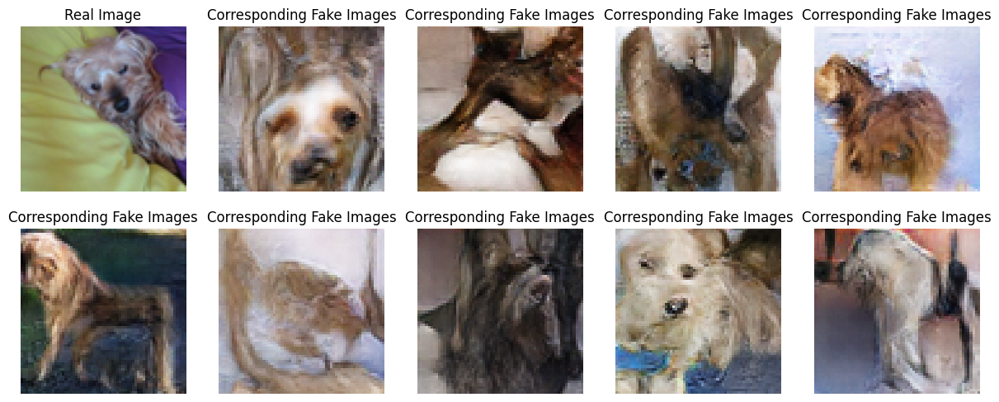


Sealyham_terrier ----REAL vs FAKE IMAGES (variety = 1.9 )-----



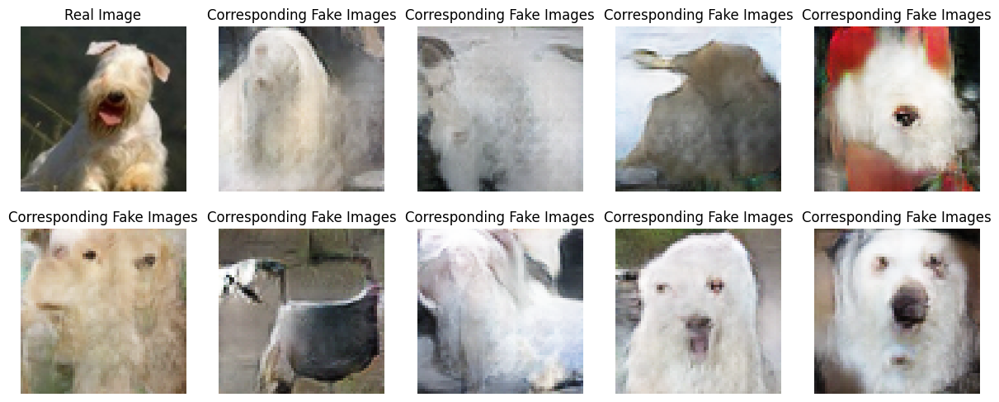


Boston_bull ----REAL vs FAKE IMAGES (variety = 1.6 )-----



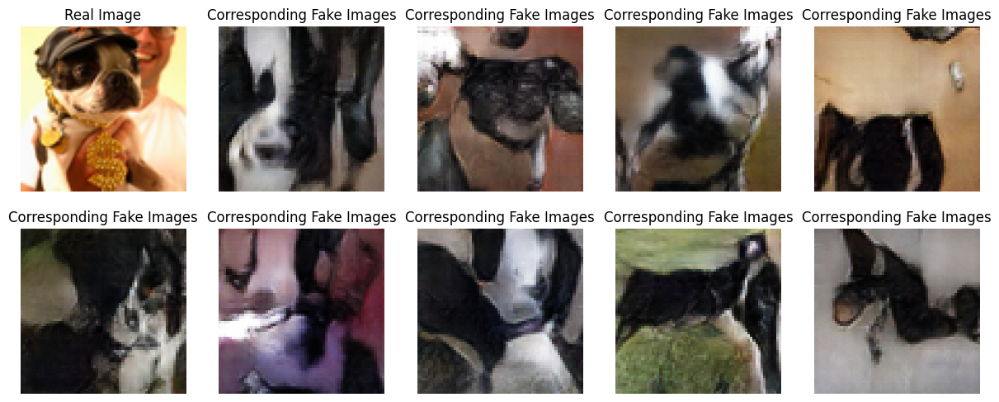


Brittany_spaniel ----REAL vs FAKE IMAGES (variety = 1.2 )-----



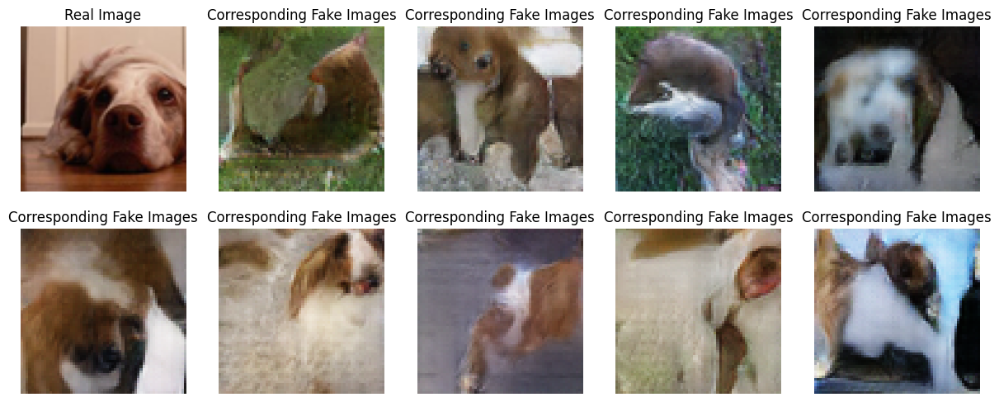


Malamute ----REAL vs FAKE IMAGES (variety = 2.0 )-----



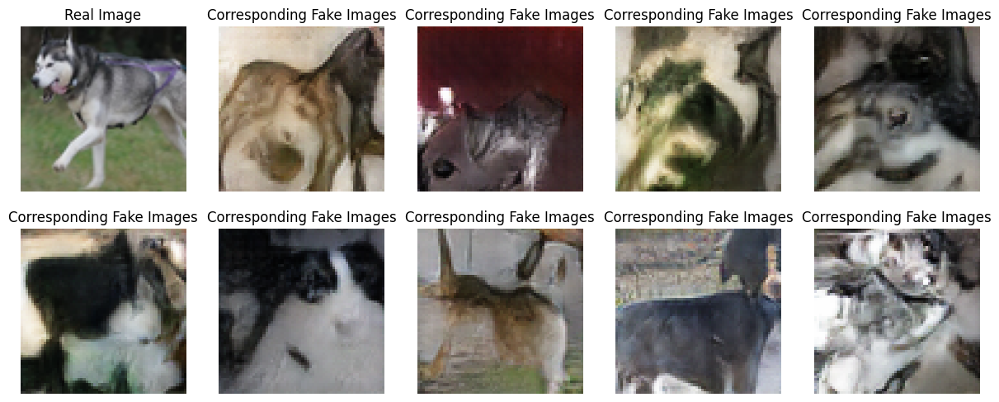


Boston_bull ----REAL vs FAKE IMAGES (variety = 1.5 )-----



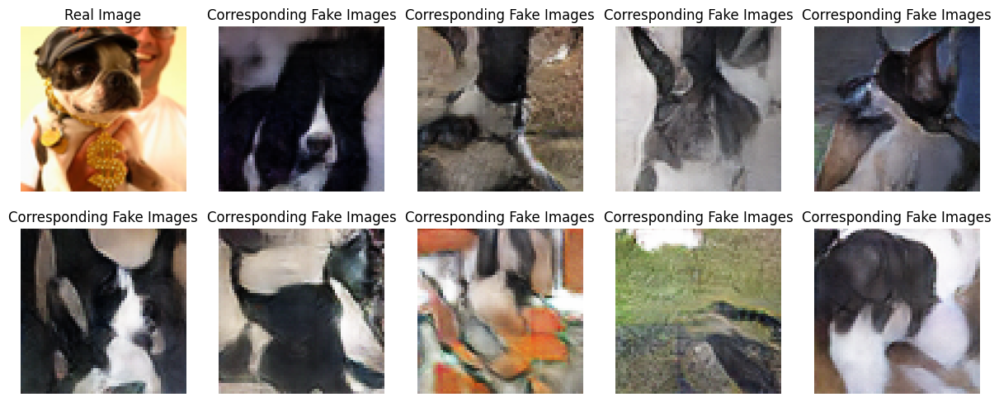

Miniature_poodle -----No display. (variety = 0.8 )-----

Soft ----REAL vs FAKE IMAGES (variety = 1.0 )-----



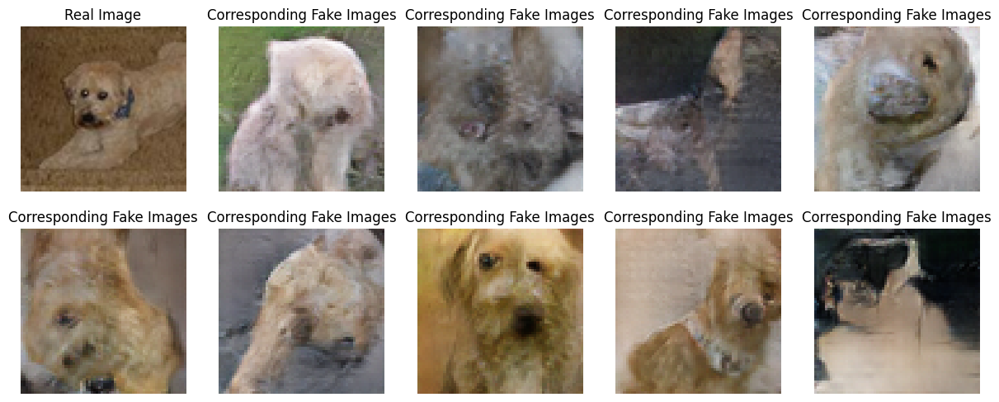


Collie ----REAL vs FAKE IMAGES (variety = 2.5 )-----



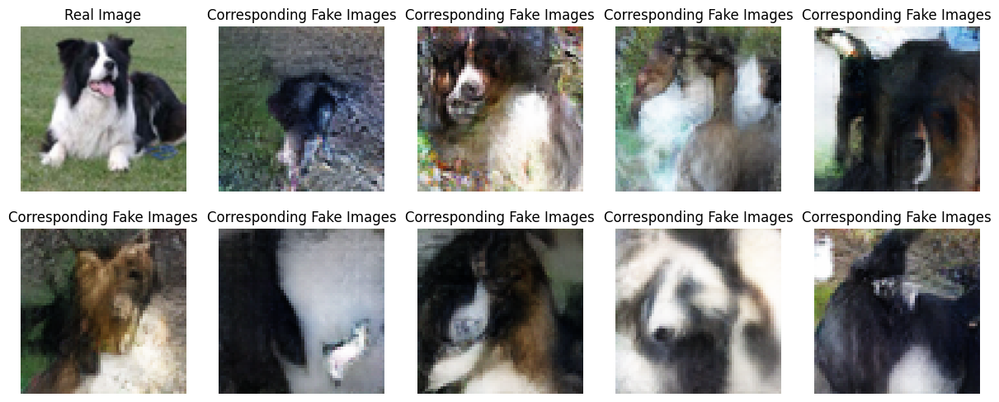


Siberian_husky ----REAL vs FAKE IMAGES (variety = 1.7 )-----



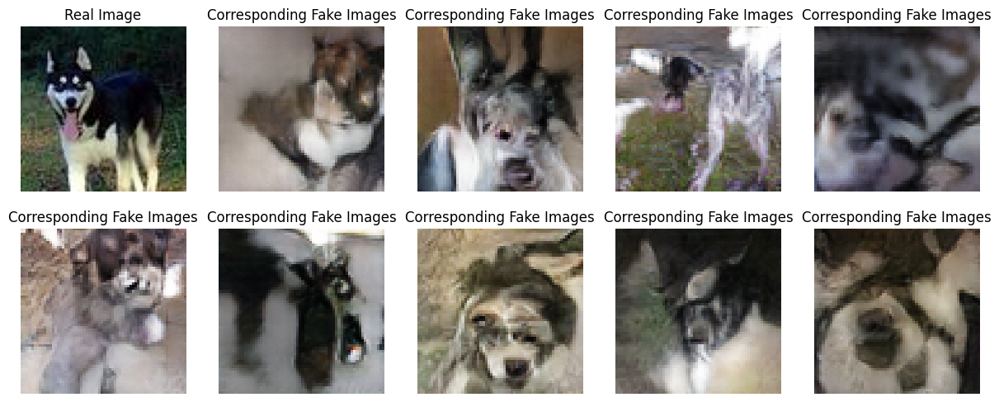

Soft -----No display. (variety = 0.8 )-----

Bloodhound ----REAL vs FAKE IMAGES (variety = 1.3 )-----



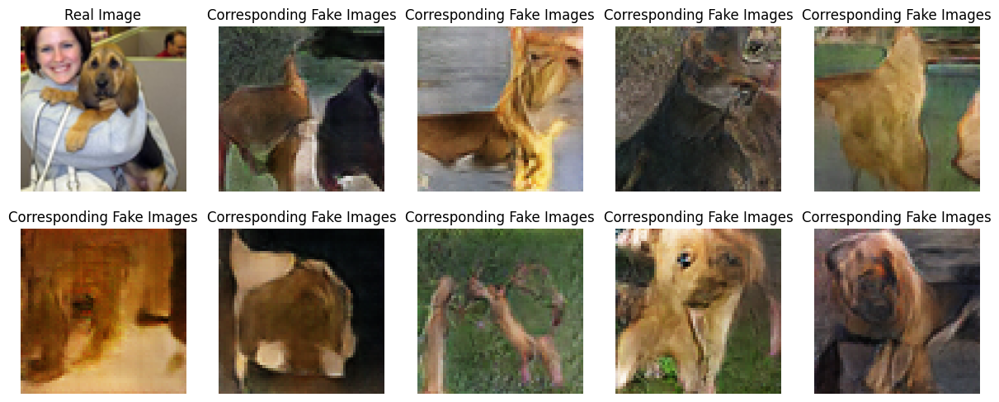


Golden_retriever ----REAL vs FAKE IMAGES (variety = 1.3 )-----



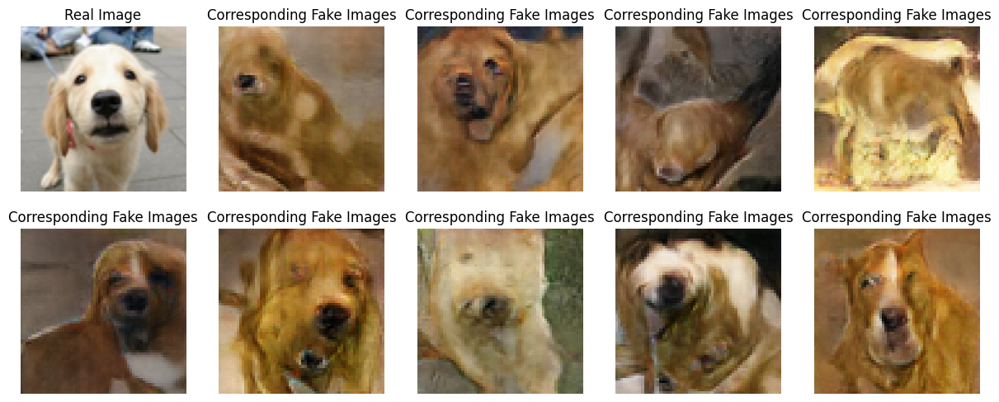


Cocker_spaniel ----REAL vs FAKE IMAGES (variety = 1.4 )-----



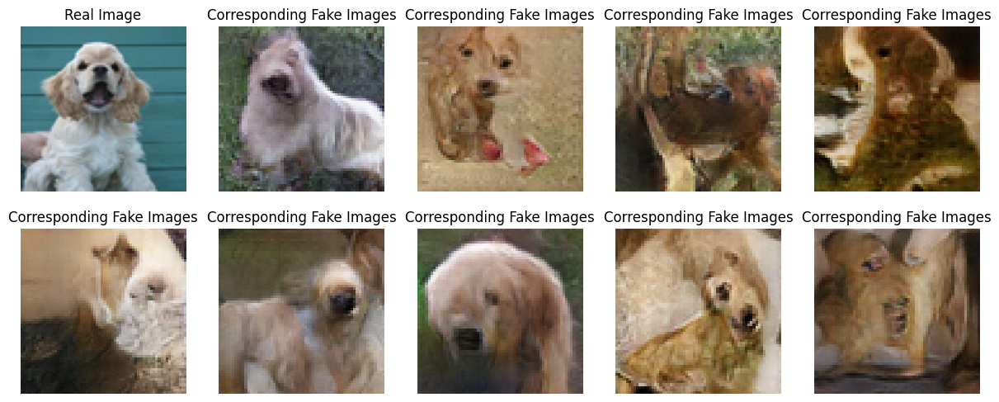


Walker_hound ----REAL vs FAKE IMAGES (variety = 1.3 )-----



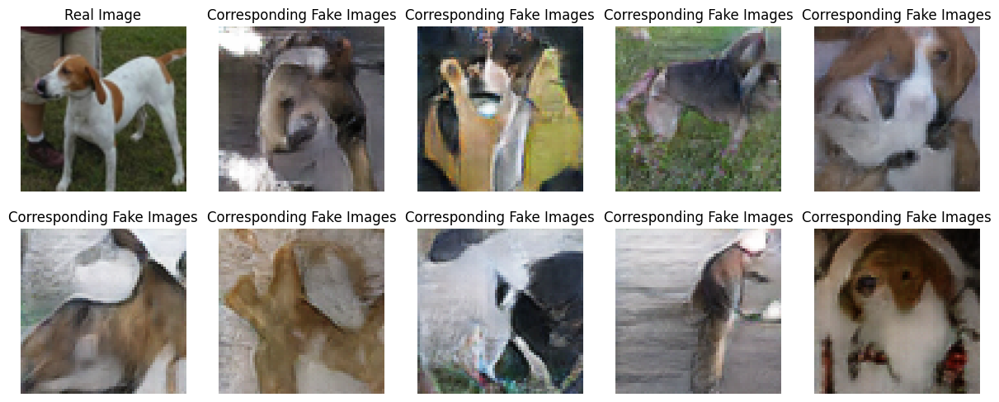

Weimaraner -----No display. (variety = 0.7 )-----

Miniature_poodle ----REAL vs FAKE IMAGES (variety = 1.0 )-----



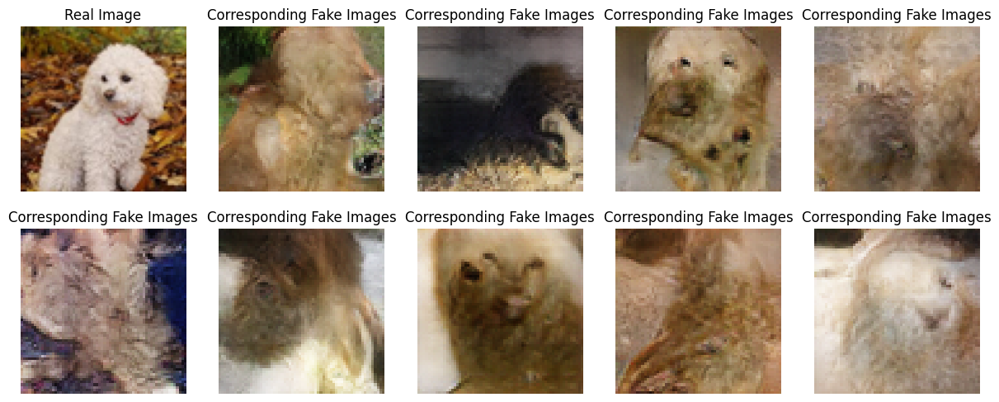


Toy_poodle ----REAL vs FAKE IMAGES (variety = 1.2 )-----



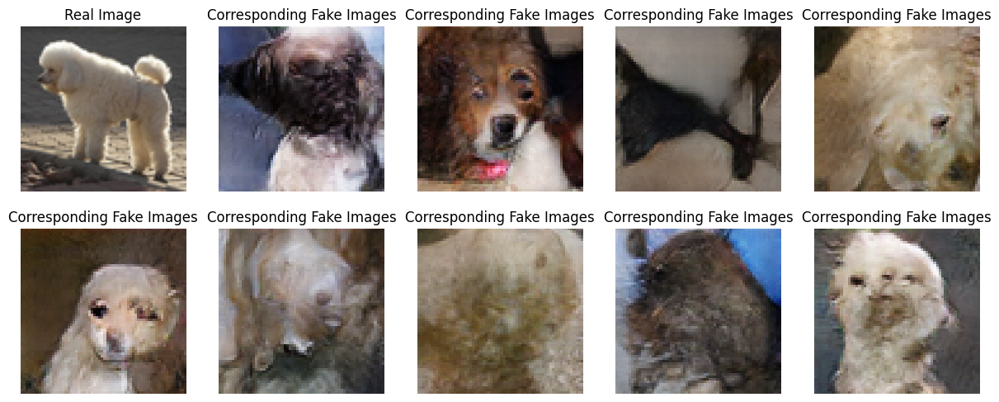


Walker_hound ----REAL vs FAKE IMAGES (variety = 1.1 )-----



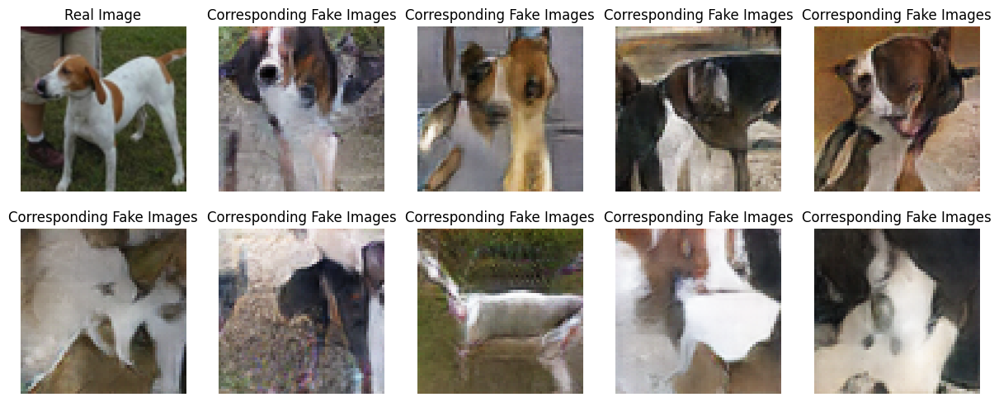

In [21]:
mse = tf.keras.losses.MeanSquaredError()

print('-----Sample Dog Images by Breed-----')
print()
for j in np.random.randint(0, 120, 25):
    # Generate random seed points for the generator
    seed = generate_latent_points(noise_dim, 10) 
    # Create labels for the generator
    labs = tf.cast(j * np.ones((10, 1)), tf.int8)  
    # Generate fake dog images
    predictions = generator([seed, labs], training=False)  
    
    # Initialize variety metric
    d = 0  
    # Find the index of the current breed   
    br = np.argwhere(namesIn == j).flatten()
    # Get the name of the current breed
    bd = le.inverse_transform(np.array([j]))[0].capitalize()  
    
    # Calculate variety metric
    for k in range(4):
        d += mse(predictions[k, :, :, :], predictions[k + 1, :, :, :])                                                                                              
    d = np.round(np.array(d), 1)  # Round the variety metric
    if d < 1.0: 
        print(bd, '-----No display. (variety =', d, ')-----')
        continue
    
    print()
    print(bd, '----REAL vs FAKE IMAGES (variety =', d, ')-----')
    print()
    plt.figure(figsize=(15, 9))
    
    # Display real dog image with title 'Real Image'
    plt.subplot(3, 5, 1)
    plt.imshow((imagesIn[br[0], :, :, :] + 1.) / 2.)
    plt.title('Real Image')
    plt.axis('off')
    # Display fake dog images with title 'Corresponding Fake Images'
    for i in range(9):
        plt.subplot(3, 5, i + 2)
        plt.imshow((predictions[i, :, :, :] + 1.) / 2.)
        plt.title('Corresponding Fake Images')
        plt.axis('off')
    plt.show()


Here, CGAN is creating better quality images and generalizing better than the simple GAN model. 